In [1]:
import warnings
#warnings.simplefilter(action='ignore', category=FutureWarning) #turn off irrelevant scipy future warning 
import heartbeat as hb
import normalizer
import importlib
import random 
import time 
import pandas as pd 
import numpy as np
from collections import Counter
from scipy import signal
from scipy.signal import find_peaks, resample
import matplotlib.pyplot as plt 
import seaborn as sns
import os 
from os import listdir
from os.path import isfile, join
import sys
import warnings 
importlib.reload(hb)
importlib.reload(normalizer)

print('Packages Loaded')

Packages Loaded


In [2]:
print('Files in Directory {}:\n'.format(os.getcwd()+'/mit_data'))
print('-------------------------------\n')
onlyfiles = [f for f in listdir(os.getcwd()+'/mit_data') if isfile(join(os.getcwd()+'/mit_data', f))]
print(sorted(onlyfiles)[1:],'\n\n***',len(onlyfiles)-1,'data files ***')   

print('\nAll patients:\n',hb.all_patients())

Files in Directory D:\Internship\1b. Heart Disease Prediction V3\ECG_Classification_Pytorch/mit_data:

-------------------------------

['100.csv', '100annotations.txt', '101.csv', '101annotations.txt', '102.csv', '102annotations.txt', '103.csv', '103annotations.txt', '104.csv', '104annotations.txt', '105.csv', '105annotations.txt', '106.csv', '106annotations.txt', '107.csv', '107annotations.txt', '108.csv', '108annotations.txt', '109.csv', '109annotations.txt', '111.csv', '111annotations.txt', '112.csv', '112annotations.txt', '113.csv', '113annotations.txt', '114.csv', '114annotations.txt', '115.csv', '115annotations.txt', '116.csv', '116annotations.txt', '117.csv', '117annotations.txt', '118.csv', '118annotations.txt', '119.csv', '119annotations.txt', '121.csv', '121annotations.txt', '122.csv', '122annotations.txt', '123.csv', '123annotations.txt', '124.csv', '124annotations.txt', '200.csv', '200annotations.txt', '201.csv', '201annotations.txt', '202.csv', '202annotations.txt', '203.

### All Types of Heat Beat Conditions from the Data Base
https://physionet.org/physiobank/annotations.shtml

In [3]:
print("MIT DATABASES CONDITIONS:\n")
hb.classes_further

MIT DATABASES CONDITIONS:



{'N': 'Normal beat',
 'L': 'Left bundle branch block beat',
 'R': 'Right bundle branch block beat',
 'A': 'Atrial premature beat',
 'a': 'Aberrated atrial premature beat',
 'J': 'Nodal (junctional) premature beat',
 'S': 'Supraventricular premature beat',
 'V': 'Premature ventricular contraction',
 'F': 'Fusion of ventricular and normal beat',
 '[': 'Start of ventricular flutter/fibrillation',
 '!': 'Ventricular flutter wave',
 ']': 'End of ventricular flutter/fibrillation',
 'e': 'Atrial escape beat',
 'j': 'Nodal (junctional) escape beat',
 'E': 'Ventricular escape beat',
 '/': 'Paced beat',
 'f': 'Fusion of paced and normal beat',
 'x': 'Non-conducted P-wave (blocked APB)',
 'Q': 'Unclassifiable beat',
 '|': 'Isolated QRS-like artifact'}

### Top k= 8 Most Common Conditions from Data Base + Count

In [4]:
hb.most_common_conditions(patients=hb.all_patients(),top_k=30)

[('N', 75052),
 ('L', 8075),
 ('R', 7259),
 ('V', 7130),
 ('/', 7028),
 ('A', 2546),
 ('+', 1291),
 ('f', 982),
 ('F', 803),
 ('~', 616),
 ('!', 472),
 ('"', 437),
 ('j', 229),
 ('x', 193),
 ('a', 150),
 ('|', 132),
 ('E', 106),
 ('J', 83),
 ('Q', 33),
 ('e', 16),
 ('[', 6),
 (']', 6),
 ('S', 2)]

### Classes we will be examining (8)

In [5]:
print('Specific_classes to be examined:\n')
classes= {0:'N',1:'L',2:'R',3:'V',4:'/',5:'A',6:'f',7:'F',8:'!',9:'j',10:'x',11:'a',12:'|',13:'E',14:'J',15:'Q',16:'e',17:'[',18:']',19:'S'}
print(classes,'\n')
for k,v in classes.items():
    print('Class {} condition: {}'.format(k+1,hb.classes_further[v]))

Specific_classes to be examined:

{0: 'N', 1: 'L', 2: 'R', 3: 'V', 4: '/', 5: 'A', 6: 'f', 7: 'F', 8: '!', 9: 'j', 10: 'x', 11: 'a', 12: '|', 13: 'E', 14: 'J', 15: 'Q', 16: 'e', 17: '[', 18: ']', 19: 'S'} 

Class 1 condition: Normal beat
Class 2 condition: Left bundle branch block beat
Class 3 condition: Right bundle branch block beat
Class 4 condition: Premature ventricular contraction
Class 5 condition: Paced beat
Class 6 condition: Atrial premature beat
Class 7 condition: Fusion of paced and normal beat
Class 8 condition: Fusion of ventricular and normal beat
Class 9 condition: Ventricular flutter wave
Class 10 condition: Nodal (junctional) escape beat
Class 11 condition: Non-conducted P-wave (blocked APB)
Class 12 condition: Aberrated atrial premature beat
Class 13 condition: Isolated QRS-like artifact
Class 14 condition: Ventricular escape beat
Class 15 condition: Nodal (junctional) premature beat
Class 16 condition: Unclassifiable beat
Class 17 condition: Atrial escape beat
Class

Generating_plot(s)...


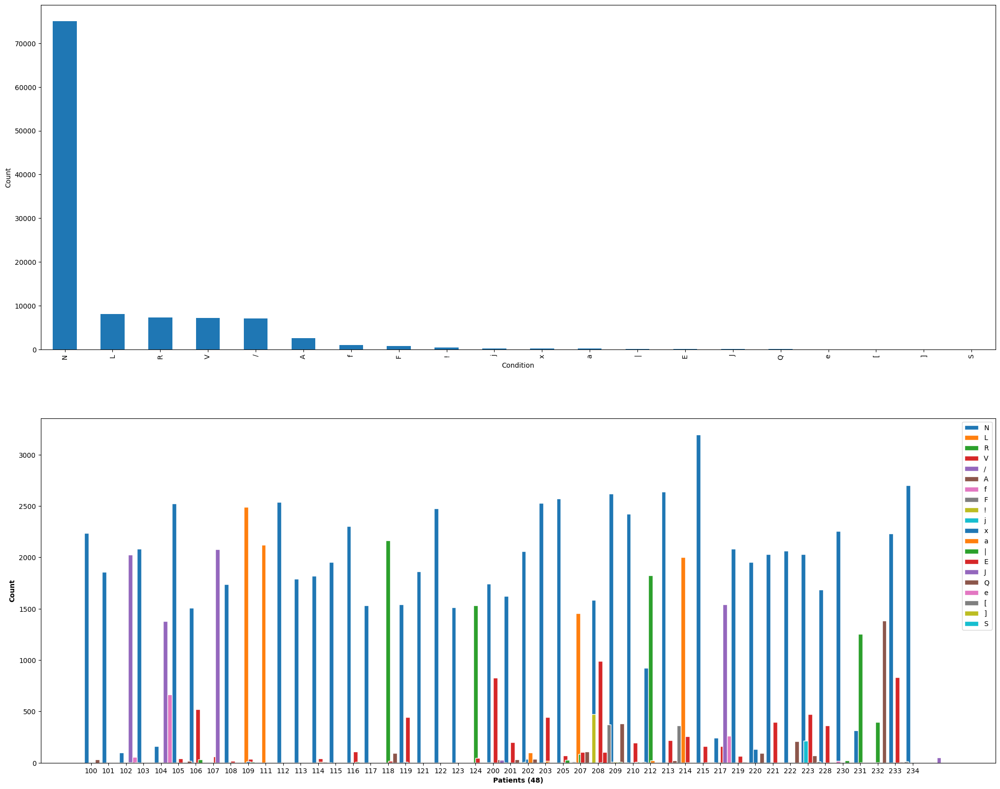

In [6]:
classes= {0:'N',1:'L',2:'R',3:'V',4:'/',5:'A',6:'f',7:'F',8:'!',9:'j',10:'x',11:'a',12:'|',13:'E',14:'J',15:'Q',16:'e',17:'[',18:']',19:'S'}
patient_dic=hb.distribution_bar(patients=hb.all_patients(),classes=classes)

### Reducing the Number of Classes. Not all patients are represented (Create a connecting Dictionary)

all_classes --> {0:'N',1:'A',2:'V',3:'F',4:'Q'}


N - Normal

A - Arrhythmia

In [6]:
classes= {0:'N',1:'A'}
classes_reducer={'N':['N'],
                 'A':['A','a','J','S','V']}
for c, subclass in classes_reducer.items():
    print('For class:',c, '({})'.format(hb.classes_further[c]))
    for i in subclass:
        print("  ({})".format(i), hb.classes_further[i])

For class: N (Normal beat)
  (N) Normal beat
For class: A (Atrial premature beat)
  (A) Atrial premature beat
  (a) Aberrated atrial premature beat
  (J) Nodal (junctional) premature beat
  (S) Supraventricular premature beat
  (V) Premature ventricular contraction


#### Classes_reducer is an optional argument that can be used to link one class to another
##### Patient Dic is a dictionary that has relevant class proportion information 

Generating_plot(s)...


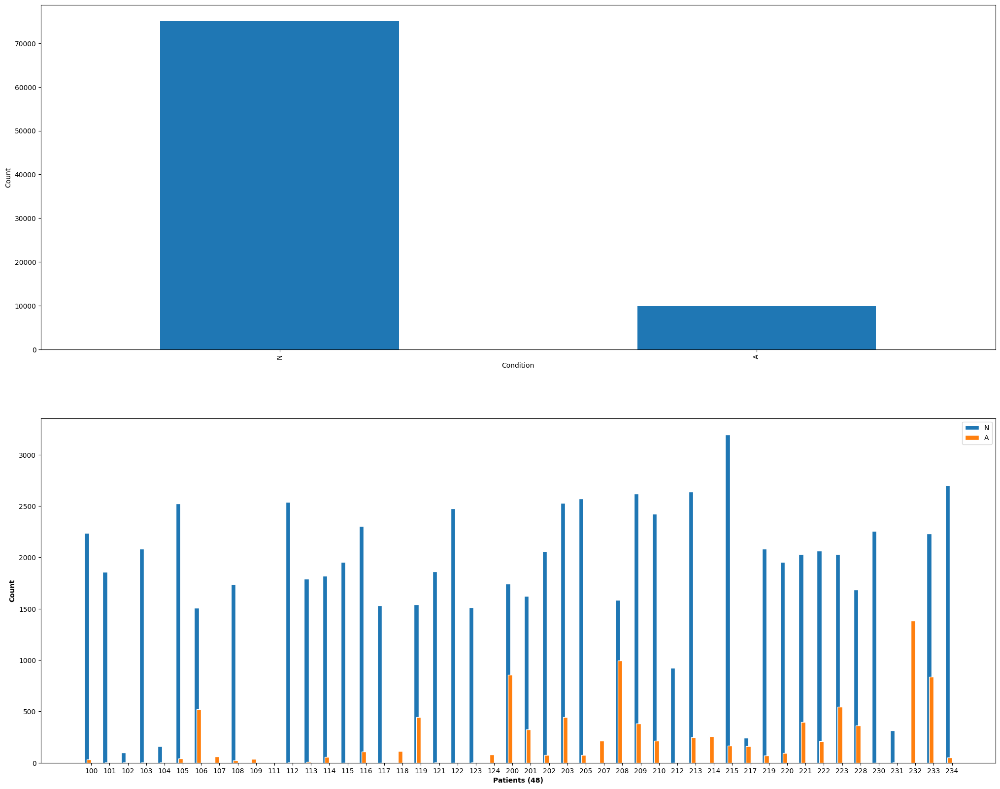

In [7]:
patient_dic=hb.distribution_bar(patients=hb.all_patients(),classes=classes,
                                classes_reducer=classes_reducer)

We notice a better distribution with joined classes. If we remove Normal conditions we can see this a little more clearly. 

### Examining sample heart rate data 
#### Run Cell As Many Times as you like to see how different patients look like (Peaks in Orange)
`hb.all_patients` : list of all patients 100 ~ 234 (48 total)<br/>
`hb.get_patient_data(patient,norm=True, sample_plot=False)`: function to plot<br/>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Assumes that all folder called mit_data is next folder 
    in current directory. 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Can change this function internally or write your own personalized one. <br/>
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Input: 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`patient`: Patient Number [Str or Int]
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`norm`: (optional) =True --> Normalize Data 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`sample_plot`: (optional) Show Patient ECG Signal [True or False]
<br/><br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Output: (If sample_plot == True: only output is a sample figure plot)
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Normalized Signal Data, Ecg Notes 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`Ecg_Notes`: Labeled Sample Peaks and Heart Conditions 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`Ecg_Data`: np.array of signal

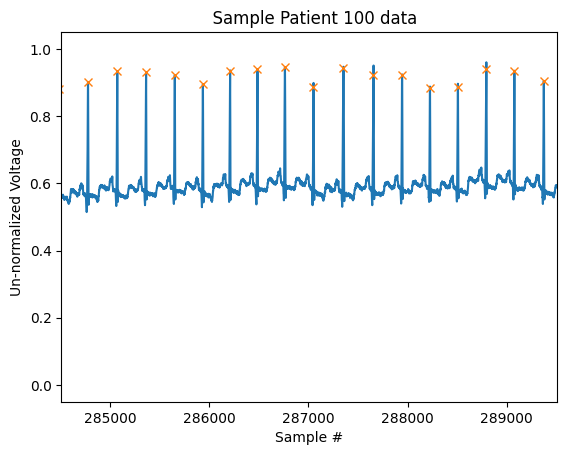

In [8]:
patient = 100
#patient=random.choice(hb.all_patients())
hb.get_patient_data(patient,norm=True,sample_plot=True)
plt.ylabel('Un-normalized Voltage')
plt.xlabel('Sample #')
plt.draw()

In [11]:
signal,ecg_notes=hb.get_patient_data(patient=101,norm=False,sample_plot=False)
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

print("Labeled Heart Beats  | Signal Data")
display_side_by_side(ecg_notes.head(),signal.to_frame().head())

Labeled Heart Beats  | Signal Data


sample_num 
 type 
 aux 
 
 
 
 
 0 
 7 
 + 
 (N 
 
 
 1 
 83 
 N 
 NaN 
 
 
 2 
 396 
 N 
 NaN 
 
 
 3 
 711 
 N 
 NaN 
 
 
 4 
 1032 
 N 
 NaN 
 
 
 
 
 
 
 signal 
 
 
 
 
 0 
 955 
 
 
 1 
 955 
 
 
 2 
 955 
 
 
 3 
 955 
 
 
 4 
 955

### Examining the Best Techniques to Normalizing data 
`hb.moving_average`: Numpy based moving average function.
    Input: signal and window size |
    Output: averaged signal
    
  

PATIENT: 219

Norm 1: Creates a mean of 0, and a std of 1
Norm 2: Creates a mean of 0, and y range from [-1 1]
Norm 3: Creates a y range from [0 1]


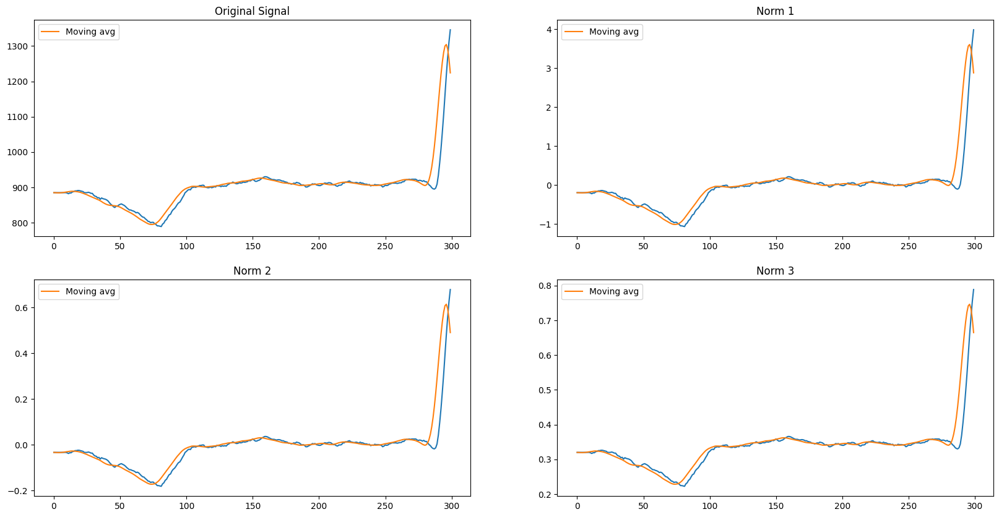

Selected Norm = 3


In [12]:
patient=random.choice(hb.all_patients())
import numpy as np
import matplotlib.pyplot as plt
def compare(patient,length,window=10):
    print("PATIENT: {}\n".format(patient))
    sig,notes= hb.get_patient_data(patient,norm=False)
    m=hb.moving_average(sig,10)
    n = np.random.choice(10*length)
    plt.figure(figsize=(20,10))
    
    plt.subplot(221)
    plt.plot(sig[0:length])
    plt.plot(m[0:length],label='Moving avg')
    plt.legend()
    plt.title('Original Signal')
    
    
    print("Norm 1: Creates a mean of 0, and a std of 1")
    plt.subplot(222)
    plt.plot(normalizer.z_norm_b(sig)[0:length])
    m=hb.moving_average(normalizer.z_norm_b(sig),window)
    plt.plot(m[0:length],label='Moving avg')
    plt.legend()
    plt.title('Norm 1')
    
    print("Norm 2: Creates a mean of 0, and y range from [-1 1]")
    plt.subplot(223)
    plt.plot(normalizer.z_norm2(sig)[0:length])
    m=hb.moving_average(normalizer.z_norm2(sig),window)
    plt.plot(m[0:length],label='Moving avg')
    plt.legend()
    plt.title('Norm 2')

    
    print("Norm 3: Creates a y range from [0 1]")
    plt.subplot(224)
    plt.plot(normalizer.z_norm(sig)[0:length])
    m=hb.moving_average(normalizer.z_norm(sig),window)
    plt.plot(m[0:length],label='Moving avg')
    plt.legend()
    plt.title('Norm 3')
    plt.show()
    
compare(patient=patient,length=300)
print('Selected Norm = 3')

### NORM 3 selected and used to normalize data 
`hb.get_patient_data()` with norm flag = True
    
  

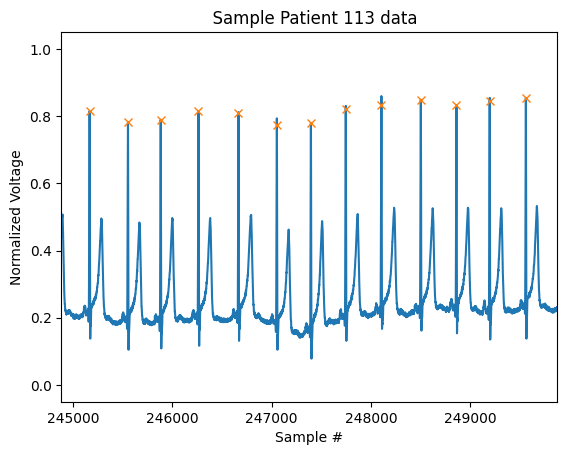

In [13]:
patient=random.choice(hb.all_patients())

hb.get_patient_data(patient,norm=True,sample_plot=True)
plt.ylabel('Normalized Voltage')
plt.xlabel('Sample #')
plt.draw()

### Heart Beat Isolation Algorithm 
##### Isolated a long ECG Singal into Peaks: Function can be adapter with `biosppy.christov_segementer`:: https://biosppy.readthedocs.io/en/stable/biosppy.signals.html

`hb.isolate_patient_data(patients,classes,classes_further,min_HR= 40,max_HR= 140,fs=360,verbose=False,plot_figs=True)`: isolation algorithim

<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Input: 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`patients`: LIST of Patient Numbers [Str or Int]
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`classes`: 
classes to be examined {dic}
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`classes_further`: (hb.classes_further) expansion of previous classes with names {dic}
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`classes_reducer`: (None) optional argument that can be used to link one class to another
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`min_HR`: (optional) minimum HR to consider (longer HR Sample Rate)
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`max_HR`: (optional) max HR to consider (longer HR Sample Rate)
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`fs`: (optional) sampling frequency --> 360 for this database
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`verbose`: (optional) prints out some information per patient if true [boolean]<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`plot_figs`: 
plot_figs:: (optional) prints out HR and Heat Beat distributions 

<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Output: 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;X, y, isolated Beats  
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`X`: np arrays of each heart beat signal (normed + zero_padded)
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`y`: np arrays of [patient, HR, and HeartBeat Class]
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`Isolated Beat`: list of lists (unpadded) of signal and associated labels

Examining 48 patients...
Percent: [>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 100.00% Done...

Padding...


Average HR Sample Len: 280.08 samples (0.78s per beat)
Average HR: 81.90 bpm
Plotting...



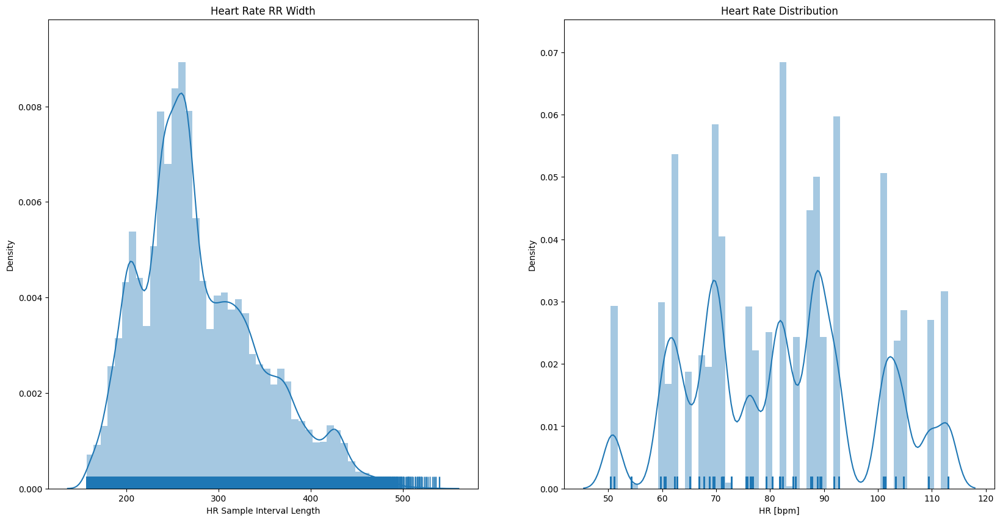

Data Loaded | Shape:(83366, 540)

    74254 cases of Normal beat

    9112 cases of Atrial premature beat

2.86min Runtime


In [14]:
#isolation algorithim heart beat data 
X,y,isolated_beat= hb.isolate_patient_data(patients=hb.all_patients(),classes=classes,
                    classes_further=hb.classes_further, classes_reducer=classes_reducer, 
                     min_HR= 40,max_HR= 140,fs=360,verbose=False,plot_figs=True)

In [15]:
print("X shape:", X.shape)
print("y shape:", y.shape)
print("sample y vals:: [patient#, HR, Condition Class]:",y[0])
print("sample y vals:: [patient#, HR, Condition Class]:",y[9876])

X shape: (83366, 537)
y shape: (83366, 3)
sample y vals:: [patient#, HR, Condition Class]: ['100' '75.536676138855' 'N']
sample y vals:: [patient#, HR, Condition Class]: ['106' '69.71624175783582' 'N']


### Resampling 360 Hz (How many data points do we need with out losing too much information per signal?)

##### (360Hz/2 ~ 180-190 Hz) 


`hb.resample_vals(X,samp_len)`: Resampling Algorithim 

<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Input: 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`X`: np arrays of each heart beat signal (normed + zero_padded)
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;`sample_len`: New Length to Resample. reample_len must be < len(X[n]) to down sample 

<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Output: 
<br/>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; X resampled  


In [16]:
# Cut Roughly in Half 
print('Resampling...\n')
X_resamp=hb.resample_vals(X,samp_len=187)
print("X_resamp shape:", X_resamp.shape)
print("y shape:", y.shape)

Resampling...

X_resamp shape: (83366, 187)
y shape: (83366, 3)


In [17]:
X_resamp1=hb.resample_vals(X, samp_len=120)

In [18]:
X_resamp1.shape

(83366, 120)

### Lets Save X,y and use Torch to see how the model performs on a deep learning frame work using COLAB GPU

In [19]:
ls

 Volume in drive D is VAK
 Volume Serial Number is 145A-46F3

 Directory of D:\Internship\1b. Heart Disease Prediction V3\ECG_Classification_Pytorch

04/26/2023  03:33 PM         2,348,699 (PPT) The Application of Deep Convolutional Networks for the Classification of ECG Signal.pdf
05/29/2023  10:34 AM    <DIR>          .
05/29/2023  10:34 AM    <DIR>          ..
05/28/2023  07:53 PM    <DIR>          .ipynb_checkpoints
05/04/2023  10:11 AM    <DIR>          __pycache__
04/26/2023  03:33 PM           609,740 An Application of Deep Convolutional Networks for the Classification of ECG Signal.pdf
05/29/2023  10:34 AM         1,727,002 ECG_notebook v2.ipynb
05/29/2023  10:28 AM         2,760,415 ECG_notebook.ipynb
04/26/2023  03:33 PM            14,845 heartbeat.py
04/26/2023  03:33 PM    <DIR>          images
04/28/2023  12:41 PM    <DIR>          mit_data
04/28/2023  12:40 PM    <DIR>          mit_data_reduced
04/27/2023  02:26 PM       150,909,058 mit_data-20230427T085810Z-001.zip
05/04

C:\Users\Administrator\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedWriter name=5>
  return process_handler(cmd, _system_body)
C:\Users\Administrator\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=6>
  return process_handler(cmd, _system_body)
C:\Users\Administrator\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\utils\_process_win32.py:124: ResourceWarning: unclosed file <_io.BufferedReader name=7>
  return process_handler(cmd, _system_body)
sys:1: ResourceWarning: Unclosed socket <zmq.Socket(zmq.PUSH) at 0x1fd8bc1e9e0>


In [20]:
pd.DataFrame(X_resamp).to_csv("X_resamped.csv")

In [21]:
pd.DataFrame(y).to_csv("y.csv")

In [22]:
X_resamp

array([[ 0.39437046,  0.63282827,  0.55933901, ..., -0.01856051,
         0.02664683, -0.04766196],
       [ 0.39767669,  0.63280725,  0.56408917, ..., -0.01754601,
         0.02566211, -0.04674669],
       [ 0.39128264,  0.62866435,  0.55206854, ..., -0.01627872,
         0.02437438, -0.04539092],
       ...,
       [ 0.31778435,  0.50928446,  0.45299442, ..., -0.01433732,
         0.02084135, -0.03775306],
       [ 0.29727668,  0.47692039,  0.42786159, ..., -0.01307953,
         0.0191943 , -0.0350683 ],
       [ 0.29531889,  0.46992662,  0.41300682, ..., -0.01314732,
         0.01918154, -0.03487496]])

In [23]:
y

array([['100', '75.536676138855', 'N'],
       ['100', '75.536676138855', 'N'],
       ['100', '75.536676138855', 'N'],
       ...,
       ['234', '91.85618420242567', 'A'],
       ['234', '91.85618420242567', 'A'],
       ['234', '91.85618420242567', 'A']], dtype='<U32')

___
### CONTINUE to Link Below if you need a GPU. Model is Run on Google CoLAB GPU 

https://colab.research.google.com/drive/1VdmThtlYrctIUHqWGsRvgE8dnb4TdYnd

(If you would like to continue locally keep moving below)

---

# Deep Learning 

#### 1. Uploading Data from (CPU) to CoLab 
#### 2. Dividing and Preparing Data For Training 
#### 3. Design Model In Pytorch (CUDA)
#### 4. Develop Training and Evaluation Metrics 
#### 5. Results
---

### Uploading Data from (CPU) to CoLab

You can skip this if you already have a GPU on the local computer and continue with X_resamp and y

In [59]:
####Get (Processed Data) into Google Drive 
#from google.colab import drive
#drive.mount('/content/gdrive')
import pandas as pd 
import numpy as np 
from random import choices
from collections import Counter 


X_resamp= pd.read_csv('X_resamped.csv')
y= pd.read_csv('y.csv')

X_resamp=X_resamp.drop(X_resamp.columns[0],axis=1).values
y=y.drop(y.columns[0],axis=1).values

In [60]:
y

array([[100, 75.536676138855, 'N'],
       [100, 75.536676138855, 'N'],
       [100, 75.536676138855, 'N'],
       ...,
       [234, 91.85618420242568, 'A'],
       [234, 91.85618420242568, 'A'],
       [234, 91.85618420242568, 'A']], dtype=object)

In [61]:
classes={0: 'N', 1: 'A'}
print('X (resampled):',X_resamp.shape,'y:',y.shape,'Classes:',classes)

def get_key(val,my_dict): 
    """
    Simple Function to Get Key 
    in Dictionary from val. 
    
    Input: Key, Dictionary 
    Output: Val
    
    """
    for key, value in my_dict.items(): 
         if val == value: 
            return key 
    return "key doesn't exist"

def one_hot(c,classes=classes):
    """
    Simple one hot encoding for the 
    types of arrthymia conditions. 
    
    class --> encode class
    'N' --> [1, 0, 0, 0, 0, 0, 0, 0]
    
    c:: current class of the object
    classes:: classes dictionary 
        
    """
    enc=np.zeros(len(classes),dtype=int).tolist()
    enc[get_key(c,classes)]= 1
    return enc
  
all_patients=['100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
              '122', '123', '124', '200', '201', '202', '203', '205', '207', '208', '209', '210', '212', '213', '214', '215', '217', '219', '220', '221', 
              '222', '223', '228', '230', '231', '232', '233', '234']

X (resampled): (83366, 187) y: (83366, 3) Classes: {0: 'N', 1: 'A'}


In [62]:
y

array([[100, 75.536676138855, 'N'],
       [100, 75.536676138855, 'N'],
       [100, 75.536676138855, 'N'],
       ...,
       [234, 91.85618420242568, 'A'],
       [234, 91.85618420242568, 'A'],
       [234, 91.85618420242568, 'A']], dtype=object)

### Dividing and Prepping Data for DL

In [63]:
from sklearn.utils import shuffle
def get_train_test(X,y,train_size,classes=classes,patients=all_patients):
  """
  Get train and test function for spliting ensuring testing has all classes
  preseting for testing/eval to see how well all classes are performing. 
  """

  sub_c={}
    
 
  for c in classes:
      C = np.argwhere(y[:,2] == list(classes.values())[c]).flatten()

      sub_c[c]=np.random.choice(C,int((C.shape[0]- C.shape[0]*train_size)))

  X_test = np.vstack([X[sub_c[0]], X[sub_c[1]]])
  y_test = np.vstack([y[sub_c[0]], y[sub_c[1]]])

  deletions=[]
  for i in range(len(sub_c)):
    deletions.extend(sub_c[i].tolist())
  
  X_train = np.delete(X, deletions, axis=0)
  y_train = np.delete(y, deletions, axis=0)

  X_train, y_train = shuffle(X_train, y_train, random_state=0)
  X_test, y_test = shuffle(X_test, y_test, random_state=0)
  y_train= np.array([get_key(y_i,classes) for y_i in y_train[:,2]])
  y_test= np.array([get_key(y_i,classes) for y_i in y_test[:,2]])
  return X_train,y_train,X_test,y_test

  

X_train,y_train,X_test,y_test=get_train_test(X=X_resamp,y=y,train_size=.80)
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)
print("X_test:", X_test.shape)
print("y_test:", y_test.shape)

X_train: (68248, 187)
y_train: (68248,)
X_test: (16672, 187)
y_test: (16672,)


In [64]:
y_test

array([0, 0, 0, ..., 0, 0, 0])

C:\Users\Administrator\AppData\Local\Temp\ipykernel_9416\1946212830.py:2: DeprecationWarning: scipy.misc.electrocardiogram has been deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. Dataset methods have moved into the scipy.datasets module. Use scipy.datasets.electrocardiogram instead.
  value = electrocardiogram()[500:1000]


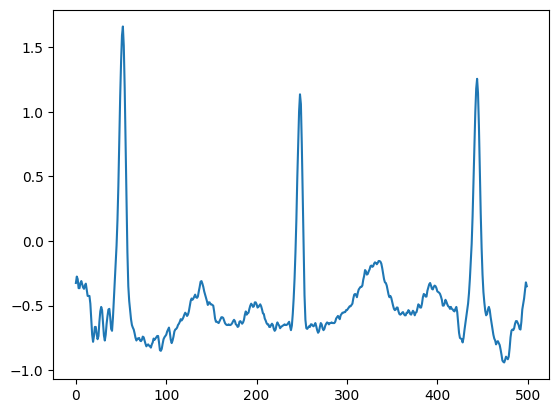

In [29]:
from scipy.misc import electrocardiogram
value = electrocardiogram()[500:1000]
plt.plot(value)
#plt.plot(peak, value[peak], "*")
#plt.plot(np.zeros_like(value), "--", color="green")
plt.show()

In [53]:
X_test

array([[ 0.21646868,  0.3337216 ,  0.29374163, ..., -0.00924593,
         0.01372372, -0.02528345],
       [ 0.29386213,  0.47633559,  0.41724227, ..., -0.01170634,
         0.01770365, -0.03335029],
       [ 0.30091292,  0.48237403,  0.43154387, ..., -0.01381092,
         0.01989984, -0.03577755],
       ...,
       [ 0.26799536,  0.41105335,  0.36476796, ..., -0.01238075,
         0.01786237, -0.03201514],
       [ 0.25545022,  0.41025825,  0.36357228, ..., -0.01218391,
         0.01739655, -0.03095394],
       [ 0.35098055,  0.56303323,  0.49789601, ..., -0.01496293,
         0.022199  , -0.040972  ]])

# ______________________________________________________________

#### Get Train, Validation, and Test Loader 

In [55]:
import warnings
from torch.utils.data.sampler import WeightedRandomSampler
import torch
from torch import optim 
import random
import torch.utils.data
from torch.utils.data.sampler import SubsetRandomSampler
import random
from torch.autograd import Variable

def imbalanced_loader(X_train,y_train,X_test,y_test,valid_size=.05,batch_size=512): # Split train into train + validation 
    """
    Get trainloader, validloader, and testloader for model training. This 
    creates equal training batches but naturally balanced validation and testing 
    sets. Note the testing set was previously augmented to get better per class metrics 
    
    Outputs: dataloader + testloader, where dataloader =  {"train": trainloader, "val": validloader}

    """
    warnings.filterwarnings("ignore") #torch bug
    print ('Getting Data... {}% Validation Set\n'.format(int(np.around(valid_size*100))))
    
    num_train = len(X_train)
    indices = list(range(num_train))
    #print(indices)
    
    split = int(np.floor(valid_size * num_train))
    #print("split",split)
    
    train_idx, valid_idx = indices[split:], indices[:split]
    print("train_idx",len(train_idx))

    print("Batch Size:",batch_size)

    print('\nTrain Len=',len(train_idx),', Validation Len=',len(valid_idx), 'Test Len=',len(y_test))
                                                                                        
  
    class_sample_count = np.array([len(np.where(y_train[[train_idx]]==t)[0]) for t in np.unique(y_train[[train_idx]])])
    print('class_sample_count', class_sample_count)
    weight = 1. / class_sample_count
    print('weight',weight)
    
    samples_weight = np.array([weight[t] for t in y_train[[train_idx]]])
    #samples_weight = [weight[t] for t in y_train[[train_idx]]]
    print('samples_weight1 = ', samples_weight)
    
    samples_weight = samples_weight.flatten() #########
    print('samples_weight2 = ', samples_weight)
    
    samples_weight = torch.from_numpy(samples_weight)
    print('samples_weight3 = ', samples_weight)
    
    train_sampler = WeightedRandomSampler(torch.tensor(samples_weight,dtype=torch.double), len(samples_weight))
    print('train_sampler = ', len(train_sampler))
    
    #################################
    
    
    #print(len(X_train[train_idx]))
    #print(len(y_train[train_idx].astype(int)))
    trainDataset = torch.utils.data.TensorDataset(torch.FloatTensor(X_train[train_idx]), torch.LongTensor(y_train[train_idx].astype(int)))
    print('trainDataset = ', len(trainDataset)) ##########
    train_sampler= torch.utils.data.BatchSampler(sampler=train_sampler, batch_size=batch_size, drop_last=True)
    print('train_sampler = ', len(train_sampler))
    trainloader = torch.utils.data.DataLoader(dataset = trainDataset, batch_size=batch_size, num_workers=1, sampler= train_sampler)
    print('trainloader = ', len(trainloader))
    
    valDataset = torch.utils.data.TensorDataset(torch.FloatTensor(X_train[valid_idx]), torch.LongTensor(y_train[valid_idx].astype(int)))
    print('valDataset = ', len(valDataset))
    sampler = torch.utils.data.RandomSampler(valDataset)
    print('sampler = ', len(sampler))
    sampler= torch.utils.data.BatchSampler(sampler, batch_size, drop_last=True)
    validloader = torch.utils.data.DataLoader(dataset = valDataset, batch_size=batch_size, num_workers=1,sampler=sampler)
    print('validloader = ', len(validloader))
    
    ##################################

    testset=[]
    for i,x in enumerate(X_test):
        print("x = ", x)
        testset.append((torch.from_numpy(x),torch.tensor([y_test[i]])))
    print(len(testset))
    
    #testloader = torch.utils.data.DataLoader(dataset = testDataset, batch_size=batch_size, shuffle=False, num_workers=1) 
    testloader = torch.utils.data.DataLoader(testset, batch_size=512,
                                           shuffle=False, num_workers=1)

    print("")
    dataloader = {"train": trainloader, "val": validloader}
    print(len(dataloader['train'].dataset))
    print('Train Size Batched=',int(len(dataloader['train'].dataset)/batch_size),', Validation Size Batched=',int(len(dataloader['val'].dataset)/batch_size),', Test Size Batched=',len(testloader))
    
    
    warnings.resetwarnings()
    return dataloader,testloader
  
#batch_size=512
#batch_size = 100
dataloader,testloader = imbalanced_loader(X_train=X_train,y_train=y_train,X_test=X_test,y_test=y_test, valid_size=.05,batch_size=512)

Getting Data... 5% Validation Set

train_idx 64847
Batch Size: 512

Train Len= 64847 , Validation Len= 3412 Test Len= 16672
class_sample_count [57729  7118]
weight [1.73223163e-05 1.40488901e-04]
samples_weight1 =  [[1.73223163e-05 1.73223163e-05 1.73223163e-05 ... 1.73223163e-05
  1.73223163e-05 1.73223163e-05]]
samples_weight2 =  [1.73223163e-05 1.73223163e-05 1.73223163e-05 ... 1.73223163e-05
 1.73223163e-05 1.73223163e-05]
samples_weight3 =  tensor([1.7322e-05, 1.7322e-05, 1.7322e-05,  ..., 1.7322e-05, 1.7322e-05,
        1.7322e-05], dtype=torch.float64)
train_sampler =  64847
trainDataset =  64847
train_sampler =  126
trainloader =  1
valDataset =  3412
sampler =  3412
validloader =  1
x =  [ 2.16468677e-01  3.33721597e-01  2.93741630e-01  3.29213243e-01
  3.02199343e-01  3.16463754e-01  2.98583246e-01  3.17092337e-01
  3.03887933e-01  3.17101348e-01  2.94015631e-01  3.12824903e-01
  2.98126766e-01  3.09805001e-01  2.93028460e-01  3.13691857e-01
  2.97011946e-01  3.02108911e-01  

x =  [ 4.32444518e-01  6.99346177e-01  6.20508611e-01  6.70569695e-01
  6.31121155e-01  6.59821844e-01  6.40152824e-01  6.54930714e-01
  6.31664321e-01  6.51409552e-01  6.38233348e-01  6.47741065e-01
  6.32199566e-01  6.43805160e-01  6.39528194e-01  6.53807772e-01
  6.37693498e-01  6.43314535e-01  6.39823357e-01  6.55713114e-01
  6.40657740e-01  6.42955274e-01  6.38700345e-01  6.49039674e-01
  6.37149670e-01  6.40984387e-01  6.35762664e-01  6.45884705e-01
  6.33396188e-01  6.39314782e-01  6.33009046e-01  6.48832718e-01
  6.41414906e-01  6.40919559e-01  6.35355114e-01  6.44158961e-01
  6.42199358e-01  6.42524470e-01  6.35089732e-01  6.47254250e-01
  6.42509878e-01  6.42762431e-01  6.29078737e-01  6.39307145e-01
  6.37350628e-01  6.45152826e-01  6.37411309e-01  6.48297287e-01
  6.55507575e-01  6.63350978e-01  6.54024685e-01  6.77104055e-01
  6.81379494e-01  6.83168294e-01  6.66070330e-01  6.67538816e-01
  6.64216023e-01  6.59675373e-01  6.42352415e-01  6.35546790e-01
  6.37270019e-01  6.

x =  [ 0.24778767  0.40503235  0.36416416  0.38852424  0.37427945  0.39203751
  0.38467766  0.39459041  0.38824454  0.39979074  0.39138213  0.39097102
  0.38366331  0.39053928  0.38680789  0.38497821  0.37786789  0.37949613
  0.38119005  0.38036288  0.37087333  0.37219172  0.37158677  0.37321688
  0.36485231  0.36821907  0.37127405  0.37029889  0.36441725  0.36577104
  0.36647314  0.37602234  0.38475423  0.39374025  0.40077053  0.40989474
  0.41206212  0.40726157  0.40054659  0.38471066  0.37054275  0.36650836
  0.35778324  0.35862011  0.35463072  0.35082257  0.35451951  0.35929867
  0.3567904   0.34842915  0.38016221  0.57603502  0.83798354  0.87010129
  0.52583077  0.13339717  0.22581902  0.33380835  0.32602832  0.35184482
  0.36174578  0.3515292   0.34927071  0.359372    0.35887353  0.35518717
  0.35903319  0.36146319  0.36689865  0.36566009  0.36390042  0.37050406
  0.38045262  0.37904743  0.38157595  0.38632574  0.39451541  0.39669025
  0.39897842  0.40680092  0.41361458  0.416897

x =  [ 3.28292514e-01  5.29010725e-01  4.73217340e-01  5.07800042e-01
  4.88513930e-01  5.18059451e-01  5.09776212e-01  5.32550341e-01
  5.38590133e-01  5.72883425e-01  5.94230841e-01  6.51846037e-01
  7.21510960e-01  8.04681313e-01  7.82564857e-01  6.31249010e-01
  4.35726929e-01  4.03359922e-01  4.53977231e-01  4.84232731e-01
  4.76820559e-01  4.79718237e-01  4.86554503e-01  4.91054289e-01
  4.86937508e-01  4.88340423e-01  4.88649202e-01  4.86296870e-01
  4.76556746e-01  4.76611359e-01  4.76598247e-01  4.77824938e-01
  4.70711604e-01  4.72681176e-01  4.72706451e-01  4.71989416e-01
  4.71365666e-01  4.77940062e-01  4.84954188e-01  4.96015699e-01
  4.97605495e-01  5.01429768e-01  5.08403120e-01  5.16753566e-01
  5.17867174e-01  5.15032133e-01  5.16195246e-01  5.15225320e-01
  5.07505543e-01  4.99162410e-01  5.01252306e-01  4.93853157e-01
  5.03926448e-01  4.49363018e-01  1.31572603e-02  4.05177618e-04
 -1.72409070e-03  1.89365343e-03 -1.85359169e-03  1.77108368e-03
 -1.68555602e-03  1.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 0.27245298  0.43715285  0.38781798  0.41657857  0.39518567  0.41391234
  0.3995494   0.4109266   0.40147436  0.4076116   0.39817821  0.40447946
  0.39763201  0.39854274  0.39565374  0.39689655  0.39130606  0.39096366
  0.39184757  0.39278185  0.39128588  0.38822193  0.38865205  0.38754167
  0.3892713   0.38678646  0.3924905   0.39873657  0.40344477  0.40361706
  0.40778562  0.40506115  0.40893762  0.40348424  0.39641645  0.39853812
  0.3998892   0.39379445  0.38906764  0.38729656  0.38326177  0.38124897
  0.37857746  0.3791848   0.37974305  0.38149042  0.3802326   0.37859281
  0.3564432   0.36220839  0.44312702  0.61297546  0.74127198  0.67484493
  0.44557256  0.35057131  0.37796358  0.393165    0.38001072  0.38070779
  0.37324717  0.37213604  0.37131334  0.36877133  0.37185687  0.36990066
  0.37018532  0.36780212  0.37472642  0.37239093  0.37639086  0.37488003
  0.38295636  0.37794549  0.38675423  0.38628112  0.39562027  0.39695196
  0.40866708  0.41170649  0.42094535  0.42617138  0

x =  [ 0.40646201  0.65008992  0.57399343  0.61797155  0.58151786  0.60543578
  0.58524526  0.60120905  0.58457754  0.59803884  0.58585149  0.59826103
  0.58738368  0.59380773  0.58662909  0.59363846  0.58509043  0.59114681
  0.5866597   0.59005453  0.58943146  0.59380137  0.59286957  0.58988584
  0.59745091  0.60552065  0.61027182  0.61076832  0.61930854  0.62093369
  0.6250188   0.61495932  0.6168955   0.60862329  0.6210705   0.60873551
  0.59946677  0.5911225   0.58970744  0.58741286  0.5853557   0.58564119
  0.58465572  0.58459179  0.581517    0.5732086   0.54736872  0.53294126
  0.57450301  0.65522693  0.79619302  0.88704496  0.66153024  0.54680686
  0.57846784  0.57614513  0.57794234  0.57377465  0.57368169  0.57617387
  0.57382221  0.57335879  0.57609962  0.57560578  0.57696132  0.57424504
  0.57719461  0.57142427  0.57675672  0.57026087  0.57746305  0.57263502
  0.58049054  0.57402309  0.58204452  0.57314702  0.5802948   0.56960691
  0.58161523  0.56943786  0.57899855  0.571117

x =  [ 0.24059724  0.37390199  0.33565518  0.36814499  0.33905001  0.35390489
  0.33958594  0.34850072  0.3300158   0.33363466  0.33127067  0.348014
  0.34084727  0.33540171  0.33721719  0.34564073  0.35307829  0.3542292
  0.36927647  0.39539497  0.41035061  0.39396489  0.40100671  0.4131987
  0.39894958  0.38293314  0.37284968  0.36517054  0.35682131  0.34736602
  0.33187559  0.33892738  0.33624021  0.3332782   0.32729091  0.32801113
  0.29356839  0.27430463  0.33141503  0.4742527   0.64069903  0.77418572
  0.83918267  0.82279002  0.74537201  0.50029825  0.34016144  0.35873492
  0.3744384   0.34159201  0.32139231  0.31343517  0.32008007  0.32700495
  0.32373144  0.32317808  0.31797546  0.33240867  0.32539622  0.32200649
  0.32422837  0.32963885  0.32508177  0.32023421  0.32117241  0.32708288
  0.32905     0.32231792  0.32861668  0.33812763  0.34830212  0.32735365
  0.33862719  0.34182239  0.36307212  0.35395008  0.36519316  0.35878783
  0.37294437  0.36132755  0.37932124  0.34985441  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 2.40970210e-01  3.83999413e-01  3.32057169e-01  3.55581969e-01
  3.37013896e-01  3.53501956e-01  3.31986626e-01  3.38259803e-01
  3.29925247e-01  3.43585836e-01  3.29991784e-01  3.38386112e-01
  3.29685454e-01  3.43878260e-01  3.36837435e-01  3.44131674e-01
  3.36033378e-01  3.52844353e-01  3.45313552e-01  3.49562133e-01
  3.47556467e-01  3.64813637e-01  3.68056953e-01  3.80981228e-01
  3.92314936e-01  4.06282502e-01  4.12468187e-01  4.07471650e-01
  3.93484404e-01  3.92045490e-01  3.92210902e-01  3.68310209e-01
  3.44212531e-01  3.36236984e-01  3.39217393e-01  3.31533163e-01
  3.24616785e-01  3.28966650e-01  3.33724686e-01  3.27397313e-01
  2.94022670e-01  2.70409379e-01  3.38770825e-01  4.97740780e-01
  6.58817764e-01  7.98358100e-01  8.62383406e-01  8.25900587e-01
  7.05243014e-01  4.49251836e-01  3.32218848e-01  3.73201279e-01
  3.56865092e-01  3.10415284e-01  3.05263339e-01  3.07035809e-01
  3.06706278e-01  3.02275914e-01  3.10799894e-01  3.13784178e-01
  3.05864007e-01  3.08935

x =  [ 2.73191176e-01  4.36056057e-01  3.76249513e-01  4.02716836e-01
  3.76677285e-01  3.97740027e-01  3.81230164e-01  3.92613823e-01
  3.77852985e-01  3.89686953e-01  3.78294882e-01  3.82400796e-01
  3.71314796e-01  3.87655516e-01  3.80457937e-01  3.82790279e-01
  3.67631169e-01  3.79659711e-01  3.84615539e-01  3.87453576e-01
  3.79578492e-01  3.95867636e-01  4.04617379e-01  3.98774737e-01
  3.89108731e-01  3.94148663e-01  3.93092410e-01  3.81605465e-01
  3.86224574e-01  4.01898536e-01  3.88152429e-01  3.84958912e-01
  3.86448613e-01  3.88957108e-01  3.79884623e-01  3.85978589e-01
  3.85632278e-01  3.85529931e-01  3.89744050e-01  3.91994472e-01
  3.82806885e-01  3.90617205e-01  3.94085944e-01  4.07312040e-01
  4.23179608e-01  4.80412138e-01  6.17079956e-01  7.58267795e-01
  5.84733349e-01  2.88279989e-01  2.31082921e-01  2.70561535e-01
  2.79144818e-01  2.75322116e-01  3.03616879e-01  3.29741615e-01
  3.26028686e-01  3.33924864e-01  3.41874469e-01  3.79722823e-01
  4.00419519e-01  3.

x =  [ 3.54021238e-01  5.73231995e-01  4.83325120e-01  5.39778593e-01
  5.06676690e-01  5.29119761e-01  5.09051322e-01  5.13999662e-01
  5.01891027e-01  5.25443117e-01  5.22352633e-01  5.29191204e-01
  4.91970887e-01  5.25014384e-01  5.10377694e-01  5.46760132e-01
  5.13418724e-01  5.30028458e-01  5.63348289e-01  5.32162622e-01
  5.01722838e-01  4.69108263e-01  4.17073993e-01  5.00139959e-01
  5.38681540e-01  6.15254248e-01  6.07811734e-01  5.52715556e-01
  5.35767057e-01  5.16017072e-01  4.88036787e-01  4.81764683e-01
  4.87075066e-01  4.92575359e-01  4.97375948e-01  4.79626738e-01
  5.02916807e-01  4.86681040e-01  4.95451844e-01  5.12234636e-01
  4.78263315e-01  5.00593973e-01  5.18426525e-01  5.15702936e-01
  5.39151103e-01  5.33205080e-01  5.63567851e-01  5.61525774e-01
  5.39025665e-01  5.73885343e-01  5.85066000e-01  5.95701088e-01
  5.76400738e-01  5.66380874e-01  5.73164579e-01  5.81649438e-01
  5.66250744e-01  5.29900841e-01  5.23654558e-01  5.31882345e-01
  5.33041045e-01  5.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 2.58059163e-01  4.23755753e-01  3.74158280e-01  4.06191416e-01
  3.77588556e-01  3.90150207e-01  3.76255579e-01  3.97372558e-01
  3.80337044e-01  3.95759574e-01  3.83946002e-01  3.91410373e-01
  3.79248774e-01  3.90088717e-01  3.78144818e-01  3.83251152e-01
  3.80799049e-01  3.85080791e-01  3.93044786e-01  4.01905132e-01
  4.02329964e-01  4.03495121e-01  3.98746078e-01  3.99266489e-01
  4.01185350e-01  3.84879055e-01  3.82542102e-01  3.79542402e-01
  3.89190441e-01  3.80657923e-01  3.65785304e-01  3.63268500e-01
  3.62710523e-01  3.64083552e-01  3.62226841e-01  3.57434137e-01
  3.54346965e-01  3.57173333e-01  3.39153444e-01  3.75119520e-01
  4.98814896e-01  7.11173825e-01  6.84404086e-01  3.37523446e-01
  1.52339412e-01  2.69206817e-01  3.26793868e-01  3.53737260e-01
  3.39191713e-01  3.50732404e-01  3.48427879e-01  3.63187293e-01
  3.49247714e-01  3.64301946e-01  3.57082490e-01  3.74239143e-01
  3.64164213e-01  3.75298099e-01  3.73505185e-01  3.93899041e-01
  3.97006872e-01  4.05121

x =  [ 3.52506057e-01  5.61137695e-01  4.98074808e-01  5.33015389e-01
  5.03349050e-01  5.27485013e-01  5.07148364e-01  5.25407555e-01
  5.12598615e-01  5.24970281e-01  5.14130077e-01  5.22942961e-01
  5.15454660e-01  5.27708249e-01  5.13972647e-01  5.24378658e-01
  5.15212824e-01  5.26798021e-01  5.15284247e-01  5.29194801e-01
  5.24586237e-01  5.41948489e-01  5.31630527e-01  5.48589379e-01
  5.43877545e-01  5.54567580e-01  5.46234168e-01  5.49548217e-01
  5.36539233e-01  5.22910469e-01  5.11945630e-01  5.16821415e-01
  5.12295811e-01  5.18557957e-01  5.14298796e-01  5.19750200e-01
  5.15941633e-01  5.20573954e-01  5.16409391e-01  5.16869713e-01
  5.30631207e-01  5.89186127e-01  6.60730565e-01  7.32493604e-01
  7.44719160e-01  6.96955293e-01  6.31717832e-01  5.91266479e-01
  5.52133122e-01  5.26717842e-01  5.02929377e-01  4.93165455e-01
  4.85984146e-01  4.88984629e-01  4.89039083e-01  4.92061867e-01
  4.87771123e-01  4.95061702e-01  4.88677488e-01  4.97200949e-01
  4.89201502e-01  4.

x =  [ 1.98780602e-01  3.19218152e-01  2.76764799e-01  3.02154223e-01
  2.82249835e-01  2.99153469e-01  2.84920483e-01  3.00094346e-01
  2.86578935e-01  3.05857019e-01  3.01878162e-01  3.17477907e-01
  3.18037643e-01  3.17790522e-01  3.02200436e-01  2.99670907e-01
  2.93818296e-01  2.95970431e-01  2.85071829e-01  2.84288854e-01
  2.83974658e-01  2.81093154e-01  2.83987334e-01  2.82378950e-01
  2.84969826e-01  2.78993709e-01  2.83141400e-01  2.81982738e-01
  2.91466674e-01  2.85109463e-01  2.89820709e-01  3.40515231e-01
  4.67265710e-01  5.13633558e-01  4.11290150e-01  1.82419789e-01
  1.32830520e-01  2.29909270e-01  2.70372255e-01  2.91525103e-01
  2.87536714e-01  3.04694282e-01  2.99203197e-01  3.14863707e-01
  3.09529815e-01  3.32750573e-01  3.34362059e-01  3.55407545e-01
  3.56266009e-01  3.80326247e-01  3.82273576e-01  4.02892056e-01
  3.94965610e-01  4.10592792e-01  3.97375169e-01  4.09366417e-01
  3.87841442e-01  3.85038664e-01  3.50079240e-01  3.45722474e-01
  3.18546653e-01  3.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 0.14141665  0.22856551  0.20680247  0.21511971  0.2114002   0.21426081
  0.21424516  0.21380786  0.2144076   0.21362845  0.2133899   0.21186348
  0.2111448   0.2095625   0.20945665  0.20650982  0.20687712  0.20695186
  0.20664458  0.20772206  0.20286536  0.20829455  0.20448875  0.20945293
  0.20182229  0.20912008  0.20115972  0.20576828  0.19651111  0.20865932
  0.19817797  0.20727536  0.19657149  0.20702464  0.19683766  0.20893356
  0.1995331   0.20577147  0.20264594  0.20852223  0.20150219  0.211028
  0.21550202  0.22301285  0.22072561  0.22983461  0.22841832  0.22433911
  0.2246281   0.21308009  0.20922055  0.20935005  0.21218585  0.20978503
  0.21425755  0.21394443  0.21677063  0.22127522  0.21279096  0.19216893
  0.19491567  0.38337344  0.69384429  0.80290239  0.41093253  0.124586
  0.19187615  0.16758007  0.21193994  0.22827417  0.23795485  0.23446525
  0.24054038  0.24067419  0.24481043  0.24624846  0.2461262   0.24928386
  0.25067504  0.25508966  0.25439898  0.26135705  0.260

x =  [ 3.12691088e-01  5.03642568e-01  4.49784612e-01  4.82819140e-01
  4.56862738e-01  4.75229191e-01  4.63791063e-01  4.77658775e-01
  4.62315232e-01  4.74062894e-01  4.64345166e-01  4.74445778e-01
  4.62840642e-01  4.68462198e-01  4.61860548e-01  4.72344055e-01
  4.62687262e-01  4.64966507e-01  4.62227290e-01  4.71396384e-01
  4.67392931e-01  4.77073994e-01  4.81327739e-01  4.95051863e-01
  4.92162285e-01  5.03403413e-01  5.16101216e-01  5.22768953e-01
  5.07518957e-01  5.11866233e-01  5.05549712e-01  4.99579376e-01
  4.83525985e-01  4.76308897e-01  4.61700561e-01  4.64417484e-01
  4.63436317e-01  4.67433895e-01  4.63327770e-01  4.69123209e-01
  4.80254888e-01  5.50459912e-01  6.41620670e-01  7.28764679e-01
  7.65359209e-01  7.43917350e-01  6.47264605e-01  5.32412937e-01
  4.86040768e-01  4.78177138e-01  4.48902758e-01  4.41119128e-01
  4.42156402e-01  4.44031023e-01  4.35188559e-01  4.33571987e-01
  4.33112745e-01  4.36009029e-01  4.28612074e-01  4.28907280e-01
  4.28975403e-01  4.

In [31]:
for hb, label in testloader:
    print(hb.dtype, ' | ',hb.shape , hb)

torch.float64  |  torch.Size([512, 187]) tensor([[ 0.2165,  0.3337,  0.2937,  ..., -0.0092,  0.0137, -0.0253],
        [ 0.2939,  0.4763,  0.4172,  ..., -0.0117,  0.0177, -0.0334],
        [ 0.3009,  0.4824,  0.4315,  ..., -0.0138,  0.0199, -0.0358],
        ...,
        [ 0.2874,  0.4554,  0.3952,  ..., -0.0105,  0.0166, -0.0321],
        [ 0.3358,  0.5380,  0.4795,  ..., -0.0144,  0.0213, -0.0391],
        [ 0.2921,  0.4765,  0.4312,  ..., -0.0132,  0.0191, -0.0346]],
       dtype=torch.float64)
torch.float64  |  torch.Size([512, 187]) tensor([[ 0.2730,  0.4359,  0.3939,  ..., -0.0127,  0.0183, -0.0327],
        [ 0.3424,  0.5461,  0.4859,  ..., -0.0157,  0.0228, -0.0411],
        [ 0.3408,  0.5423,  0.4816,  ..., -0.0154,  0.0224, -0.0406],
        ...,
        [ 0.2834,  0.4540,  0.3997,  ..., -0.0116,  0.0174, -0.0324],
        [ 0.3533,  0.5553,  0.4944,  ..., -0.0158,  0.0231, -0.0419],
        [ 0.1853,  0.3085,  0.2924,  ..., -0.0075,  0.0113, -0.0212]],
       dtype=torch.flo

In [33]:
#print(testloader.data)
import itertools    
batch_size = 2

sample_at = 5
k = int(np.floor(sample_at/batch_size))

my_sample = next(itertools.islice(testloader, k, None))
print (my_sample)

[tensor([[ 0.3229,  0.5053,  0.4365,  ..., -0.0140,  0.0206, -0.0377],
        [ 0.3690,  0.5896,  0.5210,  ..., -0.0168,  0.0243, -0.0437],
        [ 0.3150,  0.5034,  0.4438,  ..., -0.0147,  0.0211, -0.0378],
        ...,
        [ 0.2195,  0.3480,  0.3120,  ..., -0.0103,  0.0148, -0.0266],
        [ 0.3086,  0.4960,  0.4386,  ..., -0.0128,  0.0192, -0.0356],
        [ 0.3965,  0.6350,  0.5614,  ..., -0.0168,  0.0249, -0.0460]],
       dtype=torch.float64), tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [1],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [1],
        [1],
        [0],
        [0],
        [0],
        [0],
        [0],
   

In [34]:
label.flatten()

tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1,
        0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
        1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
        1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       dtype=torch.int32)

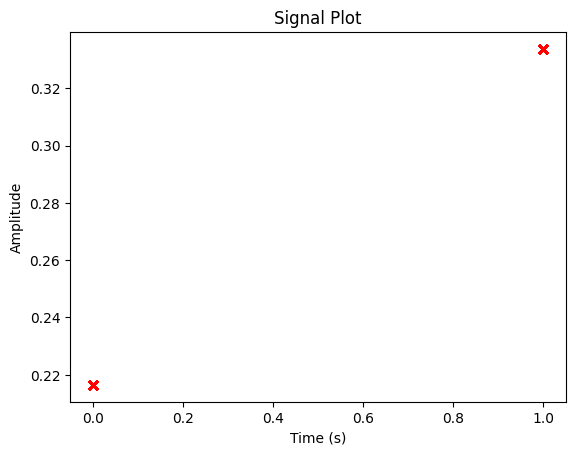

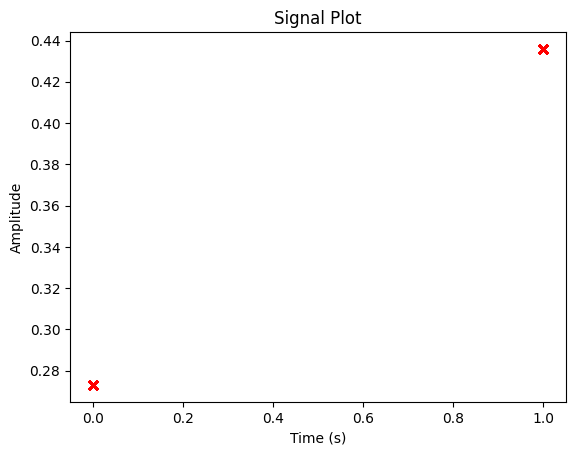

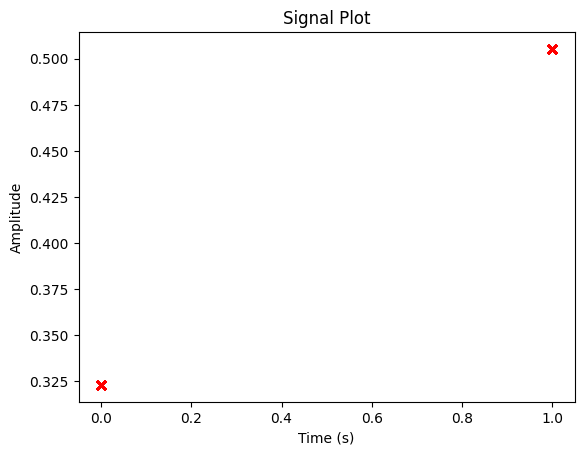

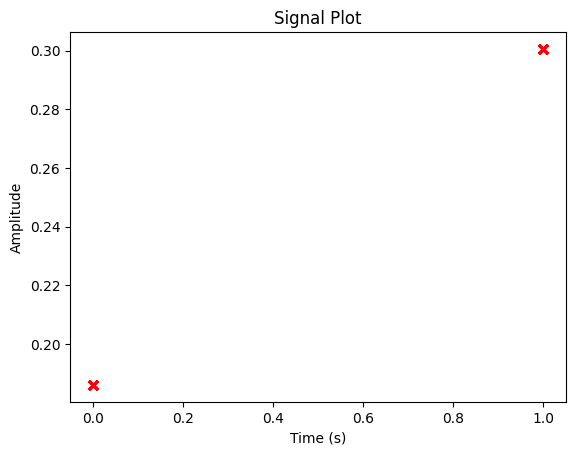

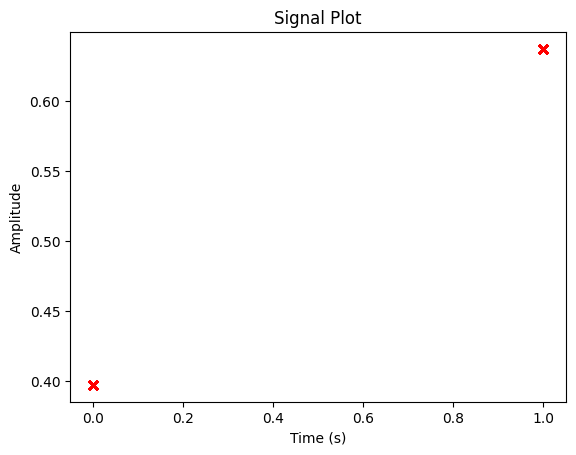

...

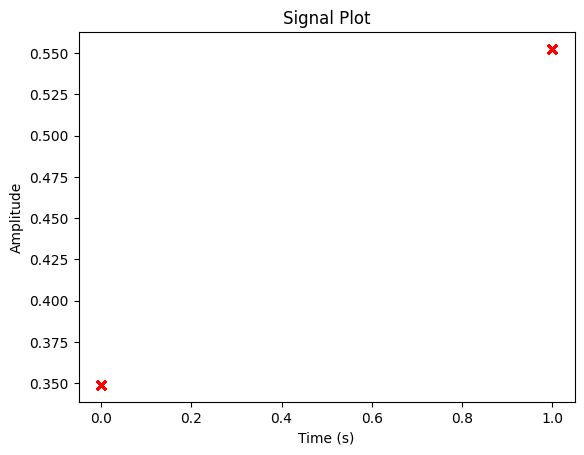

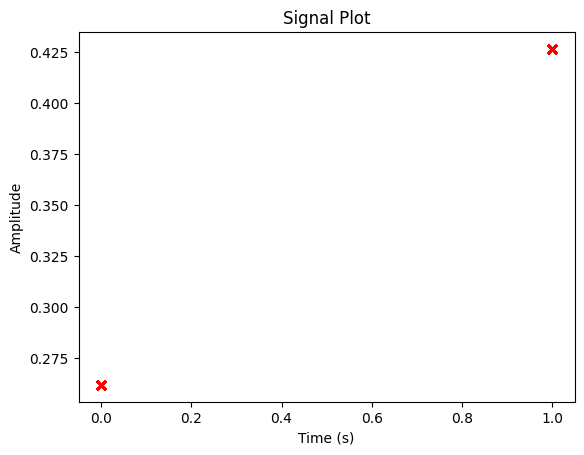

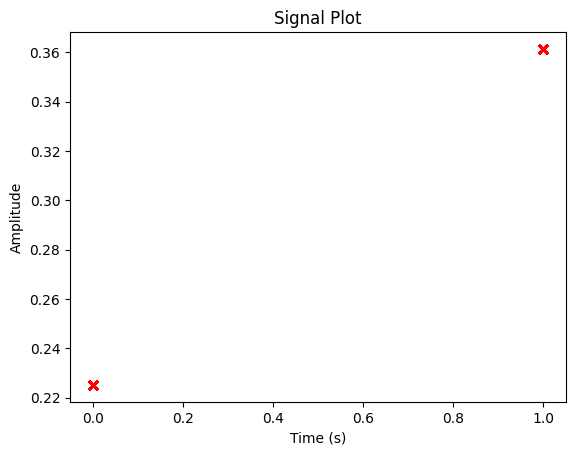

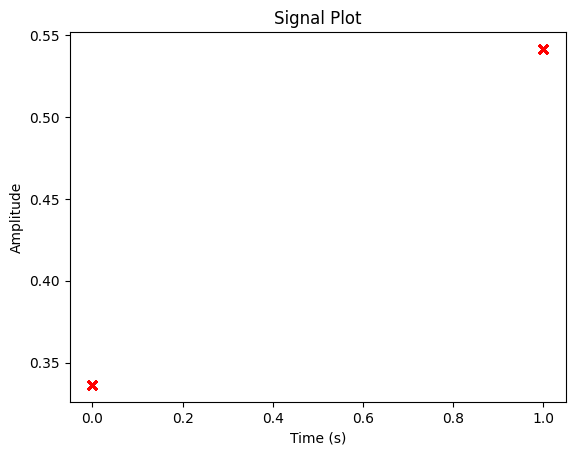

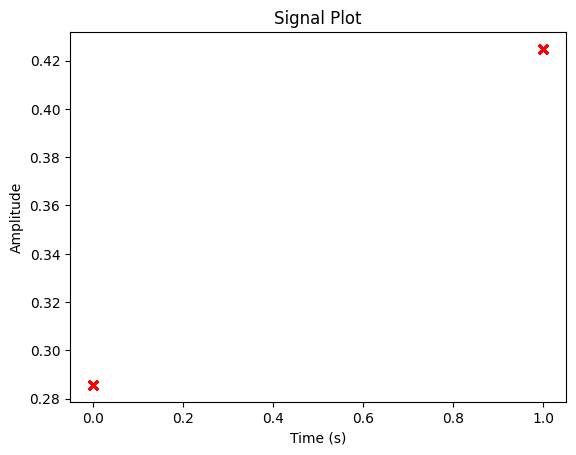

In [35]:
import wfdb
import matplotlib.pyplot as plt
import numpy as np


for hb,label in testloader:
    HB, label = np.array(hb.float().unsqueeze(1).flatten()), label.flatten()

    # Create a time axis for the signal
    time = np.arange(len(HB)) / 360.0  # Assuming a sampling rate of 360 Hz
    #fig, ax = plt.subplots()
    
    # Plot the signal
    #plt.plot(time, HB)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title('Signal Plot')
    
    #annotations = np.loadtxt('annotations.txt', dtype=int)

    # Add vertical lines at the positions of the annotations
    plt.scatter(label, HB[label], color='r', marker='x')
        
    plt.show()

In [36]:
for hb, sample in enumerate(testloader):
    print(hb, sample)
    #print(sample.inp.is_pinned())
    #print(sample.tgt.is_pinned())

0 [tensor([[ 0.2165,  0.3337,  0.2937,  ..., -0.0092,  0.0137, -0.0253],
        [ 0.2939,  0.4763,  0.4172,  ..., -0.0117,  0.0177, -0.0334],
        [ 0.3009,  0.4824,  0.4315,  ..., -0.0138,  0.0199, -0.0358],
        ...,
        [ 0.2874,  0.4554,  0.3952,  ..., -0.0105,  0.0166, -0.0321],
        [ 0.3358,  0.5380,  0.4795,  ..., -0.0144,  0.0213, -0.0391],
        [ 0.2921,  0.4765,  0.4312,  ..., -0.0132,  0.0191, -0.0346]],
       dtype=torch.float64), tensor([[0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [0],
        [1],
        [0],
        [0],
        [0],
 

#### Lets see how classes are balanced for training 
(Testing and Validation sets have natural balance)

In [38]:
for hb,labels in dataloader['train']:
    for hb_index,label in enumerate(labels):
        print(hb_index,hb[hb_index].size(),label.cpu().numpy().shape,Counter(label.cpu().numpy().flatten()))

0 torch.Size([512, 187]) (512,) Counter({1: 257, 0: 255})
1 torch.Size([512, 187]) (512,) Counter({0: 259, 1: 253})
2 torch.Size([512, 187]) (512,) Counter({0: 259, 1: 253})
3 torch.Size([512, 187]) (512,) Counter({1: 266, 0: 246})
4 torch.Size([512, 187]) (512,) Counter({1: 275, 0: 237})
5 torch.Size([512, 187]) (512,) Counter({1: 261, 0: 251})
6 torch.Size([512, 187]) (512,) Counter({1: 258, 0: 254})
7 torch.Size([512, 187]) (512,) Counter({0: 275, 1: 237})
8 torch.Size([512, 187]) (512,) Counter({1: 261, 0: 251})
9 torch.Size([512, 187]) (512,) Counter({0: 258, 1: 254})
10 torch.Size([512, 187]) (512,) Counter({1: 259, 0: 253})
11 torch.Size([512, 187]) (512,) Counter({0: 262, 1: 250})
12 torch.Size([512, 187]) (512,) Counter({1: 272, 0: 240})
13 torch.Size([512, 187]) (512,) Counter({1: 264, 0: 248})
14 torch.Size([512, 187]) (512,) Counter({0: 262, 1: 250})
15 torch.Size([512, 187]) (512,) Counter({1: 279, 0: 233})
16 torch.Size([512, 187]) (512,) Counter({1: 281, 0: 231})
17 torc

### Model Architecture 

In [39]:
import torch.nn as nn
import torch.nn.functional as F
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

print("""\nA 1D CNN is very effective when you expect to derive interesting features from shorter 
(fixed-length) segments of the overall data set and where the location of the feature 
within the segment is not of high relevance.\n""")

class Anomaly_Classifier(nn.Module):
    def __init__(self, input_size,num_classes):
        super(Anomaly_Classifier, self).__init__()
    
        self.conv= nn.Conv1d(in_channels=input_size, out_channels=32, kernel_size=5,stride=1)
        
        self.conv_pad = nn.Conv1d(in_channels=32, out_channels=32, kernel_size=5,stride=1,padding=2)
        self.drop_50 = nn.Dropout(p=0.5)

        self.maxpool = nn.MaxPool1d(kernel_size=5,stride=2) 

        self.dense1 = nn.Linear(32 * 8, 32) 
        self.dense2 = nn.Linear(32, 32) 
        
        self.dense_final = nn.Linear(32, num_classes)
        self.softmax= nn.LogSoftmax(dim=1)

    def forward(self, x):
        residual= self.conv(x)
      
        #block1 
        x = F.relu(self.conv_pad(residual))
        x = self.conv_pad(x)
        x+= residual 
        x = F.relu(x)
        residual = self.maxpool(x) #[512 32 90]
       
        #block2
        x=F.relu(self.conv_pad(residual))
        x=self.conv_pad(x)
        x+=residual
        x= F.relu(x)
        residual = self.maxpool(x) #[512 32 43]
        
        
        #block3
        x=F.relu(self.conv_pad(residual))
        x=self.conv_pad(x)
        x+=residual
        x= F.relu(x)
        residual = self.maxpool(x) #[512 32 20]
        
        
        #block4
        x=F.relu(self.conv_pad(residual))
        x=self.conv_pad(x)
        x+=residual
        x= F.relu(x)
        x= self.maxpool(x) #[512 32 8]
        
        #MLP
        x = x.view(-1, 32 * 8) #Reshape (current_dim, 32*2)
        x = F.relu(self.dense1(x))
        #x = self.drop_60(x)
        x= self.dense2(x)
        x = self.softmax(self.dense_final(x))
        return x
      
print('Model Architecture Init\n')

print("OPTIMIZER = optim.Adam(anom_classifier.parameters(),lr = 0.001) \n ")

cpu

A 1D CNN is very effective when you expect to derive interesting features from shorter 
(fixed-length) segments of the overall data set and where the location of the feature 
within the segment is not of high relevance.

Model Architecture Init

OPTIMIZER = optim.Adam(anom_classifier.parameters(),lr = 0.001) 
 


### Training and Evaluation Functions

In [40]:
import matplotlib.pyplot as plt 
import torch.optim as optim
import time 
import sklearn 
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import itertools


def reset_weights(model):
  """
  model.apply(reset_weights) will reset all the model parameters.
  This way the model is not overwhelmed 
  
  """
  if isinstance(model, nn.Conv1d) or isinstance(model, nn.Linear):
      model.reset_parameters()
      
def calc_accuracy(output,Y):
  
    # get acc_scores during training 
    max_vals, max_indices = torch.max(output,1)
    train_acc = (max_indices == Y).sum().data.cpu().numpy()/max_indices.size()[0]
    return train_acc
  
def train_model(data_loader, model, criterion,optimizer, n_epochs=100,print_every=10,verbose=True,plot_results=True,validation=True):
  
  """
  Model Training Function.
  Input:
    
    Dataloader: {'train':trainloader,'val':validloader} --> If no validation is used set Validation = False & dataloader= {'train':trainloader}
    model: model.cuda() if gpu will be used, else cpu
    print_every: print every n epochs 
    verbose: print out results per epoch 
    plot_results: plot the train and valid loss 
    validation: is validation set in dataloader
  
  Output:
  
    trained classifier 
  
  """

  losses=[]
  start= time.time()
  print('Training for {} epochs...\n'.format(n_epochs))
  for epoch in range(n_epochs):
      if verbose == True and epoch % print_every== 0:
        print('\n\nEpoch {}/{}:'.format(epoch+1, n_epochs))
        
      if validation == True: 
        evaluation=['train', 'val']
      else:
        
        evaluation=['train']
        
      # Each epoch has a training and validation phase
      for phase in evaluation:
          if phase == 'train': 
              model.train(True)  # Set model to training mode
          else:
              model.train(False)  # Set model to evaluate mode

          running_loss = 0.0

          # Iterate over data.
          for hb,labels in data_loader[phase]:
            for hb_index,label in enumerate(labels):
#                 print(hb[hb_index].size(),label.cpu().numpy().shape,Counter(label.cpu().numpy().flatten()))
                HB, label = hb[hb_index].unsqueeze(1), label

                # forward + backward + optimize
                outputs = model(HB)
                acc= calc_accuracy(outputs,label)
                loss = criterion(outputs, label)#loss function 
                # zero the parameter (weight) gradients
                optimizer.zero_grad()

                # backward + optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    # update the weights
                    optimizer.step()

                # print loss statistics
                running_loss += loss.item()

            losses.append(running_loss) 

          if verbose == True and epoch % print_every== 0: 
            print('{} loss: {:.4f} | acc: {:.4f}|'.format(phase, running_loss,acc), end=' ')
  if verbose == True:        
    print('\nFinished Training  | Time:{}'.format(time.time()-start))
  if plot_results == True:
    plt.figure(figsize=(10,10))
    plt.plot(losses[0::2],label='train_loss')
    if validation == True:
      plt.plot(losses[1::2],label='validation_loss')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.draw()
  
  return model 



def evaluate(testloader, trained_model,verbose= True):
  """
  Evaluation Metric Platfrom. Feed in the trained model 
  and test loader data. 
  
  Returns classification metric along with 
  predictions,truths
  
  """
  
  truth=[]
  preds=[]
  for hb,label in testloader:
      HB, label = hb.float().unsqueeze(1), label
      outputs = trained_model(HB)
      _, predicted = torch.max(outputs, 1)
      preds.append(predicted.cpu().numpy().tolist())
      truth.append(label.cpu().numpy().tolist())
  
  preds_flat = [item for sublist in preds for item in sublist]
  truth_flat = [item for sublist in truth for item in sublist] 
 

  if verbose == True:
    print('\nEvaluating....')
    print("TEST ACC:",accuracy_score(truth_flat,preds_flat))
    print(classification_report(truth_flat,preds_flat))
  
  return preds_flat,truth_flat



def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
    
    
def get_kernel_size(n_h,k_h,n_w,k_w,p_h=0,s_h=1,p_w=0,s_w=1):
    """
    Kernel Measuring Function 
    """
    return [int((n_h-k_h+p_h+s_h)/s_h),int((n_w-k_w+p_w+s_w)/s_w)]    
    
    
def variation(n_epochs,num_iters=5):
  p=[]
  t=[]
  accuracy_scores=[]
  for i in range(num_iters):
    print('\nModel {}/{}...\n'.format(i+1,num_iters))
    Anomaly_Classifier(input_size=1,num_classes= 5).apply(reset_weights)
    print('Weights Reset')
    anom_classifier= Anomaly_Classifier(input_size=1,num_classes= 8)
    criterion = nn.NLLLoss()
    optimizer = optim.Adam(anom_classifier.parameters(),lr = 0.001) 
    trained_classifier= train_model(data_loader=dataloader, model=anom_classifier,
                                    criterion = criterion,optimizer = optimizer ,
                                    n_epochs=n_epochs,print_every=1,verbose=False,plot_results=False, 
                                    validation=True)
    
    preds,truth = evaluate(testloader=testloader, trained_model = trained_classifier,verbose=False)
    t.append(truth)
    p.append(preds)
    print(accuracy_score(truth,preds))
    accuracy_scores.append(accuracy_score(truth,preds))
  return p,t,accuracy_scores
print('Functions Ready')

Functions Ready


## Training 

Weights Reset
Training for 10 epochs...



Epoch 1/10:
train loss: 42.6891 | acc: 0.9453| val loss: 0.7017 | acc: 0.9707| 

Epoch 2/10:
train loss: 19.1875 | acc: 0.9551| val loss: 0.7332 | acc: 0.9609| 

Epoch 3/10:
train loss: 15.9481 | acc: 0.9609| val loss: 0.7947 | acc: 0.9473| 

Epoch 4/10:
train loss: 13.3523 | acc: 0.9629| val loss: 0.7090 | acc: 0.9648| 

Epoch 5/10:
train loss: 12.1894 | acc: 0.9531| val loss: 0.4695 | acc: 0.9668| 

Epoch 6/10:
train loss: 11.2114 | acc: 0.9648| val loss: 0.4316 | acc: 0.9746| 

Epoch 7/10:
train loss: 10.4758 | acc: 0.9746| val loss: 0.4736 | acc: 0.9551| 

Epoch 8/10:
train loss: 9.6831 | acc: 0.9785| val loss: 0.4550 | acc: 0.9785| 

Epoch 9/10:
train loss: 9.2457 | acc: 0.9766| val loss: 0.2265 | acc: 0.9863| 

Epoch 10/10:
train loss: 9.1315 | acc: 0.9805| val loss: 0.3915 | acc: 0.9766| 
Finished Training  | Time:372.7276363372803


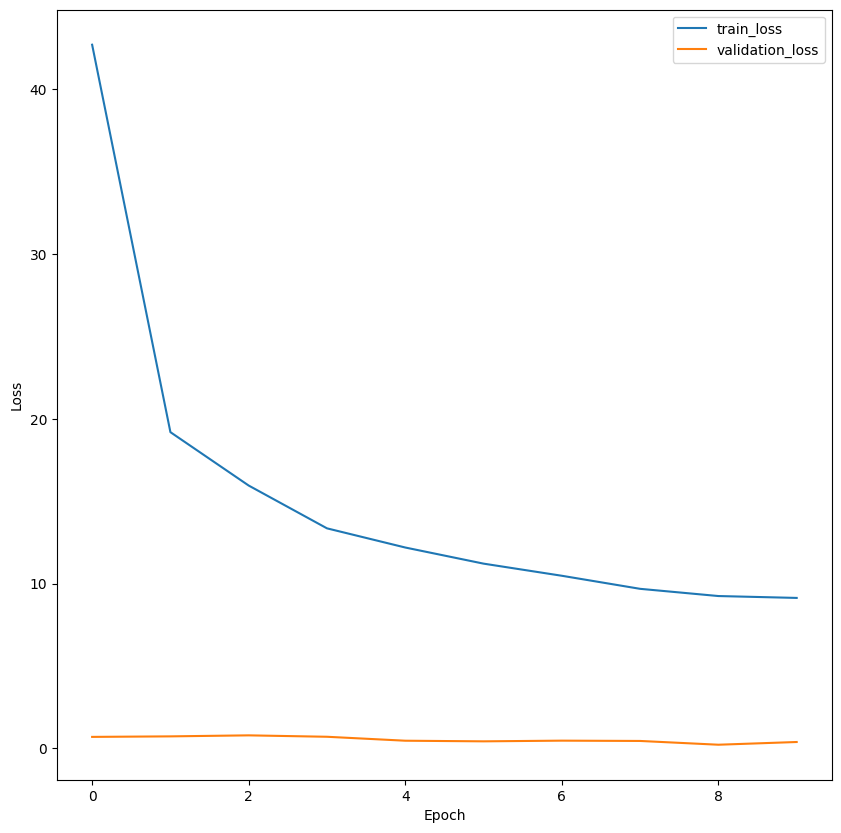

In [42]:
Anomaly_Classifier(input_size=1,num_classes= 2).apply(reset_weights)
print('Weights Reset')
anom_classifier= Anomaly_Classifier(input_size=1,num_classes= 2)
criterion = nn.NLLLoss()
optimizer = optim.Adam(anom_classifier.parameters(),lr = 0.001) 
trained_classifier2 = train_model(data_loader=dataloader, model=anom_classifier, criterion = criterion,optimizer = optimizer ,
                                            n_epochs=10,print_every=1,verbose=True,plot_results=True, validation=True)

In [45]:
preds,truth = evaluate(testloader=testloader, trained_model = trained_classifier2,verbose=True)


Evaluating....
TEST ACC: 0.9764875239923224
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     14850
           1       0.84      0.97      0.90      1822

    accuracy                           0.98     16672
   macro avg       0.92      0.97      0.94     16672
weighted avg       0.98      0.98      0.98     16672



In [47]:
trained_classifier2

Anomaly_Classifier(
  (conv): Conv1d(1, 32, kernel_size=(5,), stride=(1,))
  (conv_pad): Conv1d(32, 32, kernel_size=(5,), stride=(1,), padding=(2,))
  (drop_50): Dropout(p=0.5, inplace=False)
  (maxpool): MaxPool1d(kernel_size=5, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dense1): Linear(in_features=256, out_features=32, bias=True)
  (dense2): Linear(in_features=32, out_features=32, bias=True)
  (dense_final): Linear(in_features=32, out_features=2, bias=True)
  (softmax): LogSoftmax(dim=1)
)

Normalized confusion matrix


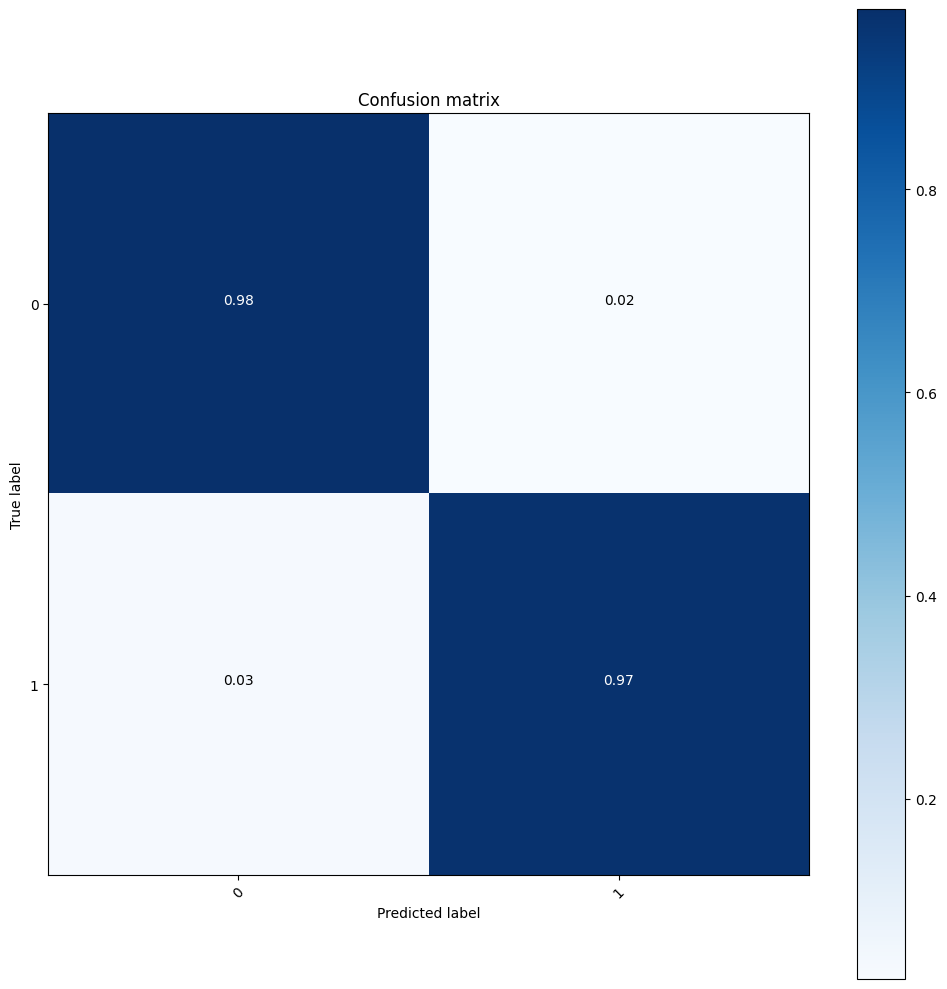

In [46]:
cm = confusion_matrix(y_true=truth, y_pred=preds)
plot_confusion_matrix(cm=cm,normalize=True,classes=classes)

## Saving the trained weights to trained_classifier2.pth weights file

In [44]:
# Save the trained weights to a file on the desktop
weights_path = "D:\\Internship\\1b. Heart Disease Prediction V3\\ECG_Classification_Pytorch\\trained_weights.pth"
torch.save(trained_classifier2.state_dict(), weights_path)
print("Trained weights saved successfully!")

Trained weights saved successfully!


In [51]:
anom_classifier.load_state_dict(torch.load(weights_path))
anom_classifier.eval()

# Test the model on data
# Assuming you have a test_loader containing the test data
with torch.no_grad():
    preds, truths = evaluate(testloader, anom_classifier, verbose=True)


Evaluating....
TEST ACC: 0.9764875239923224
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     14850
           1       0.84      0.97      0.90      1822

    accuracy                           0.98     16672
   macro avg       0.92      0.97      0.94     16672
weighted avg       0.98      0.98      0.98     16672



In [ ]:
#isolation algorithim heart beat data 
X,y,isolated_beat = hb.isolate_patient_data(patients=hb.all_patients(),classes=classes,
                    classes_further=hb.classes_further, classes_reducer=classes_reducer, 
                     min_HR= 40,max_HR= 140,fs=360,verbose=False,plot_figs=True)

# Predicting Unseen Data Samples

In [62]:
#test_data = pd.read_csv('Test/1) V,f.csv')
data = np.genfromtxt('Test/1) V,f.csv', delimiter=',')

In [80]:
data.dtype, data.shape

(dtype('float64'), (685,))

In [82]:
import heartbeat as hb
data_resamp=hb.resample_vals(data,samp_len=187)

IndexError: tuple index out of range

In [64]:
data[1:]

array([1039., 1037., 1039., 1041., 1039., 1040., 1039., 1035., 1033.,
       1037., 1035., 1036., 1033., 1030., 1032., 1033., 1034., 1033.,
       1030., 1029., 1031., 1029., 1035., 1032., 1033., 1030., 1031.,
       1032., 1034., 1034., 1034., 1033., 1033., 1038., 1044., 1045.,
       1058., 1097., 1169., 1200., 1158., 1104., 1084., 1080., 1076.,
       1075., 1072., 1070., 1070., 1063., 1063., 1066., 1065., 1064.,
       1064., 1064., 1066., 1068., 1073., 1072., 1070., 1068., 1064.,
       1065., 1064., 1062., 1065., 1066., 1076., 1091., 1101., 1101.,
       1092., 1076., 1048., 1019.,  998.,  984.,  974.,  964.,  963.,
        967.,  975.,  980.,  988.,  995., 1006., 1017., 1026., 1027.,
       1028., 1026., 1027., 1029., 1031., 1030., 1030., 1027., 1023.,
       1027., 1026., 1025., 1022., 1023., 1022., 1025., 1027., 1026.,
       1024., 1025., 1022., 1026., 1028., 1029., 1028., 1027., 1024.,
       1026., 1027., 1028., 1027., 1023., 1024., 1025., 1026., 1026.,
       1026., 1022.,

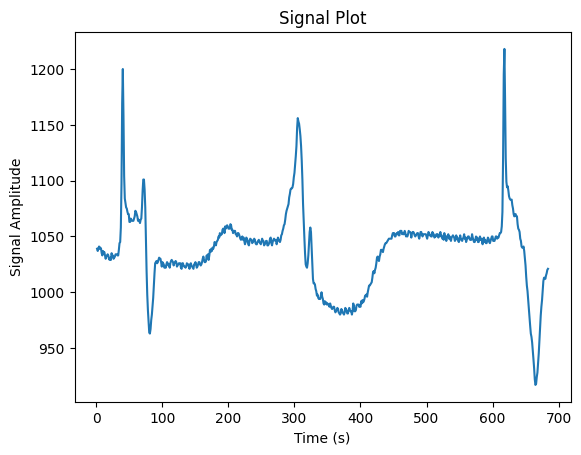

In [66]:
time = [i for i in range(len(data))]
signal_data = data[:]

fs = 360  # Replace with your sampling frequency
dt = 1 / fs


#plt.plot(test_data.signal)

fig, ax = plt.subplots()
ax.plot(time, signal_data)
ax.set_xlabel('Time (s)')
ax.set_ylabel('Signal Amplitude')
ax.set_title('Signal Plot')

# Apply any signal processing filters or transformations as desired
# For example, to apply a low-pass filter:
#fc = 100  # Replace with your cutoff frequency
#b, a = signal.butter(4, 2 * fc * dt, 'lowpass')
#filtered_signal = signal.filtfilt(b, a, signal_data)
#ax.plot(time, filtered_signal, 'r-', linewidth=2)

plt.show()

In [71]:
outputs = trained_classifier2(data)

TypeError: conv1d() received an invalid combination of arguments - got (numpy.ndarray, Parameter, Parameter, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: ([31;1mnumpy.ndarray[0m, [31;1mParameter[0m, [31;1mParameter[0m, [31;1mtuple of (int,)[0m, [31;1mtuple of (int,)[0m, [31;1mtuple of (int,)[0m, [32;1mint[0m)
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, str padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: ([31;1mnumpy.ndarray[0m, [31;1mParameter[0m, [31;1mParameter[0m, [31;1mtuple of (int,)[0m, [31;1mtuple of (int,)[0m, [31;1mtuple of (int,)[0m, [32;1mint[0m)


In [ ]:
widths= [4,8,11,6,3,5,5,8]
    
patient=str(patient)
ecg_notes= pd.read_fwf('mit_data/{}annotations.txt'.format(patient),widths=widths).drop(['Unnamed: 0'],axis=1)

ecg_data= pd.read_csv('mit_data/{}.csv'.format(patient))
ecg_data.columns= ['samp_num','signal','V']

ecg_notes=ecg_notes[['Sample #','Type','Aux']]
ecg_notes.columns=['sample_num','type','aux']

if norm == True:
    ecg_data.signal= z_norm(ecg_data.signal)
    
if sample_plot == True:
    peaklist= ecg_notes.sample_num.astype(int).values
    plt.figure()
    b=np.random.choice(len(ecg_data.signal))
    plt.plot(ecg_data.signal)
    plt.xlim(b,b+5000)
    plt.plot(peaklist, ecg_data.signal[peaklist], "x")
    plt.title('  Sample Patient {} data'.format(patient))
    return None